# Midsemester Project - Machine Learning

## Imports

In [3]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
from scipy.stats import chi2_contingency
from scipy import stats

In [4]:
# Function to extract target variable from the features.... from personal assignment 2
def automate_feature_selection(df, target_column):
    # Separate target from the features
    X = df.drop(columns=[target_column]).values  # Feature matrix
    y = df[target_column].values  # Target vector
    return X, y

## Loading the data

In [6]:
# Create a dataframe for the data
data = pd.read_csv("Arline data.csv")

In [7]:
# Comfirm the data was loaded
data

,satisfaction,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,...,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes,Arrival Delay in Minutes
0,satisfied,Female,Loyal Customer,65,Personal Travel,Eco,265,0,0,0,...,2,3,3,0,3,5,3,2,0,0.0
1,satisfied,Male,Loyal Customer,47,Personal Travel,Business,2464,0,0,0,...,2,3,4,4,4,2,3,2,310,305.0
2,satisfied,Female,Loyal Customer,15,Personal Travel,Eco,2138,0,0,0,...,2,2,3,3,4,4,4,2,0,0.0
3,satisfied,Female,Loyal Customer,60,Personal Travel,Eco,623,0,0,0,...,3,1,1,0,1,4,1,3,0,0.0
4,satisfied,Female,Loyal Customer,70,Personal Travel,Eco,354,0,0,0,...,4,2,2,0,2,4,2,5,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,satisfied,Female,disloyal Customer,29,Personal Travel,Eco,1731,5,5,5,...,2,2,3,3,4,4,4,2,0,0.0
129876,dissatisfied,Male,disloyal Customer,63,Personal Travel,Business,2087,2,3,2,...,1,3,2,3,3,1,2,1,174,172.0
129877,dissatisfied,Male,disloyal Customer,69,Personal Travel,Eco,2320,3,0,3,...,2,4,4,3,4,2,3,2,155,163.0
129878,dissatisfied,Male,disloyal Customer,66,Personal Travel,Eco,2450,3,2,3,...,2,3,3,2,3,2,1,2,193,205.0


## Exploratory Data Analysis

In [9]:
# Display the first five rows of the dataframe
data.head()

,satisfaction,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,...,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes,Arrival Delay in Minutes
0,satisfied,Female,Loyal Customer,65,Personal Travel,Eco,265,0,0,0,...,2,3,3,0,3,5,3,2,0,0.0
1,satisfied,Male,Loyal Customer,47,Personal Travel,Business,2464,0,0,0,...,2,3,4,4,4,2,3,2,310,305.0
2,satisfied,Female,Loyal Customer,15,Personal Travel,Eco,2138,0,0,0,...,2,2,3,3,4,4,4,2,0,0.0
3,satisfied,Female,Loyal Customer,60,Personal Travel,Eco,623,0,0,0,...,3,1,1,0,1,4,1,3,0,0.0
4,satisfied,Female,Loyal Customer,70,Personal Travel,Eco,354,0,0,0,...,4,2,2,0,2,4,2,5,0,0.0


In [10]:
# Generates summary statistics for the numerical columns in the dataFrame 
data.describe()

,Age,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,Gate location,Inflight wifi service,Inflight entertainment,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes,Arrival Delay in Minutes
count,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129487.000000
mean,39.427957,1981.409055,2.838597,2.990645,2.851994,2.990422,3.249130,3.383477,3.519703,3.472105,3.465075,3.485902,3.695673,3.340807,3.705759,3.352587,14.713713,15.091129
std,15.119360,1027.115606,1.392983,1.527224,1.443729,1.305970,1.318818,1.346059,1.306511,1.305560,1.270836,1.292226,1.156483,1.260582,1.151774,1.298715,38.071126,38.465650
min,7.000000,50.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,27.000000,1359.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000,3.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,40.000000,1925.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,4.000000,0.000000,0.000000
75%,51.000000,2544.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,5.000000,4.000000,5.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,85.000000,6951.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


In [11]:
# Provides a concise summary of the dataFrame's structure and contents
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   satisfaction                       129880 non-null  object 
 1   Gender                             129880 non-null  object 
 2   Customer Type                      129880 non-null  object 
 3   Age                                129880 non-null  int64  
 4   Type of Travel                     129880 non-null  object 
 5   Class                              129880 non-null  object 
 6   Flight Distance                    129880 non-null  int64  
 7   Seat comfort                       129880 non-null  int64  
 8   Departure/Arrival time convenient  129880 non-null  int64  
 9   Food and drink                     129880 non-null  int64  
 10  Gate location                      129880 non-null  int64  
 11  Inflight wifi service              1298

In [12]:
# Check for missing values
data.isnull().sum()

satisfaction                           0
Gender                                 0
Customer Type                          0
Age                                    0
Type of Travel                         0
Class                                  0
Flight Distance                        0
Seat comfort                           0
Departure/Arrival time convenient      0
Food and drink                         0
Gate location                          0
Inflight wifi service                  0
Inflight entertainment                 0
Online support                         0
Ease of Online booking                 0
On-board service                       0
Leg room service                       0
Baggage handling                       0
Checkin service                        0
Cleanliness                            0
Online boarding                        0
Departure Delay in Minutes             0
Arrival Delay in Minutes             393
dtype: int64

In [13]:
# separate the categorical columns from the numeric columns
categorical = data.select_dtypes(exclude='number')
numerical = data.select_dtypes(include='number')

In [14]:
# Explore dataframe to extract categorical columns which are encoded already
for i in data.columns.tolist():
    value_counts = data[i].value_counts()
    print(i)
    print()
    print(value_counts)
    print()
    print()

satisfaction

satisfaction
satisfied       71087
dissatisfied    58793
Name: count, dtype: int64


Gender

Gender
Female    65899
Male      63981
Name: count, dtype: int64


Customer Type

Customer Type
Loyal Customer       106100
disloyal Customer     23780
Name: count, dtype: int64


Age

Age
39    3692
25    3511
40    3209
44    3104
41    3089
      ... 
74      61
76      60
79      52
78      44
85      25
Name: count, Length: 75, dtype: int64


Type of Travel

Type of Travel
Business travel    89693
Personal Travel    40187
Name: count, dtype: int64


Class

Class
Business    62160
Eco         58309
Eco Plus     9411
Name: count, dtype: int64


Flight Distance

Flight Distance
1963    92
1812    88
1639    87
1981    86
1789    86
        ..
4222     1
5049     1
5378     1
5613     1
4260     1
Name: count, Length: 5398, dtype: int64


Seat comfort

Seat comfort
3    29183
2    28726
4    28398
1    20949
5    17827
0     4797
Name: count, dtype: int64


Departure/Arrival time

In [15]:
# Add encoded categorical columns to categorical dataframe and drop from numerical
categorical_list = ["Seat comfort","Departure/Arrival time convenient", "Food and drink","Gate location","Inflight wifi service","Inflight entertainment","Online support","Ease of Online booking","On-board service","Leg room service","Baggage handling","Checkin service","Cleanliness","Online boarding"]
for cat in categorical_list:
    categorical[cat] = numerical[cat]
numerical.drop(categorical_list, axis = 1, inplace = True)

In [16]:
categorical

,satisfaction,Gender,Customer Type,Type of Travel,Class,Seat comfort,Departure/Arrival time convenient,Food and drink,Gate location,Inflight wifi service,Inflight entertainment,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding
0,satisfied,Female,Loyal Customer,Personal Travel,Eco,0,0,0,2,2,4,2,3,3,0,3,5,3,2
1,satisfied,Male,Loyal Customer,Personal Travel,Business,0,0,0,3,0,2,2,3,4,4,4,2,3,2
2,satisfied,Female,Loyal Customer,Personal Travel,Eco,0,0,0,3,2,0,2,2,3,3,4,4,4,2
3,satisfied,Female,Loyal Customer,Personal Travel,Eco,0,0,0,3,3,4,3,1,1,0,1,4,1,3
4,satisfied,Female,Loyal Customer,Personal Travel,Eco,0,0,0,3,4,3,4,2,2,0,2,4,2,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,satisfied,Female,disloyal Customer,Personal Travel,Eco,5,5,5,3,2,5,2,2,3,3,4,4,4,2
129876,dissatisfied,Male,disloyal Customer,Personal Travel,Business,2,3,2,4,2,1,1,3,2,3,3,1,2,1
129877,dissatisfied,Male,disloyal Customer,Personal Travel,Eco,3,0,3,3,3,2,2,4,4,3,4,2,3,2
129878,dissatisfied,Male,disloyal Customer,Personal Travel,Eco,3,2,3,2,3,2,2,3,3,2,3,2,1,2


In [17]:
# Handle missing values in the numerical dataframe
sc = SimpleImputer(strategy = 'mean')
scaled = sc.fit_transform(numerical)
numerical = pd.DataFrame(scaled, columns = numerical.columns)

In [18]:
# Comfirm if correctly imputed
numerical.isnull().sum()

Age                           0
Flight Distance               0
Departure Delay in Minutes    0
Arrival Delay in Minutes      0
dtype: int64

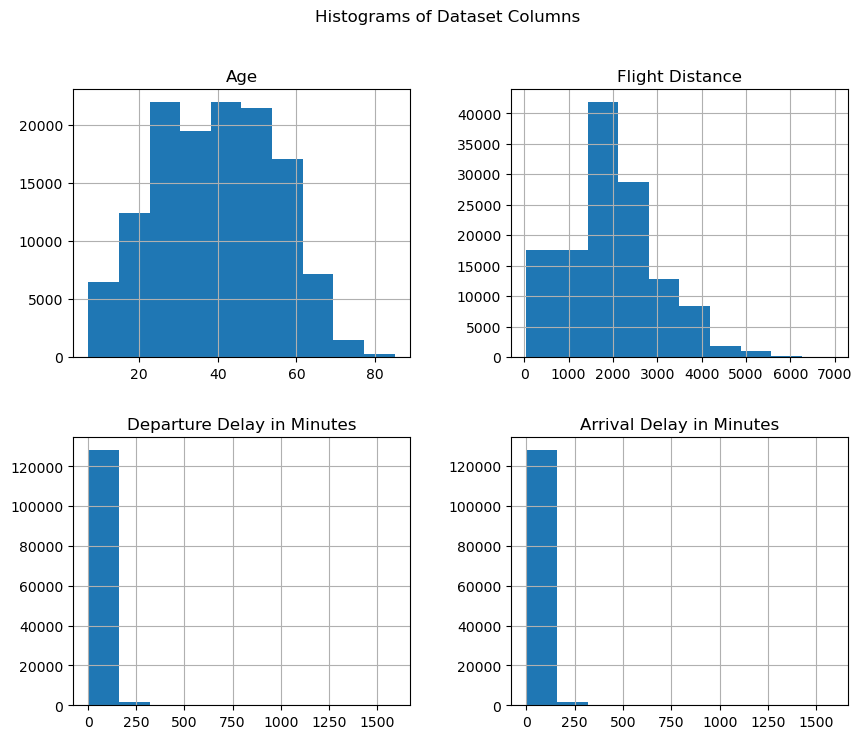

In [19]:
# Explore numerical features
numerical.hist(bins=10, figsize=(10, 8))
plt.suptitle("Histograms of Dataset Columns")
plt.show()


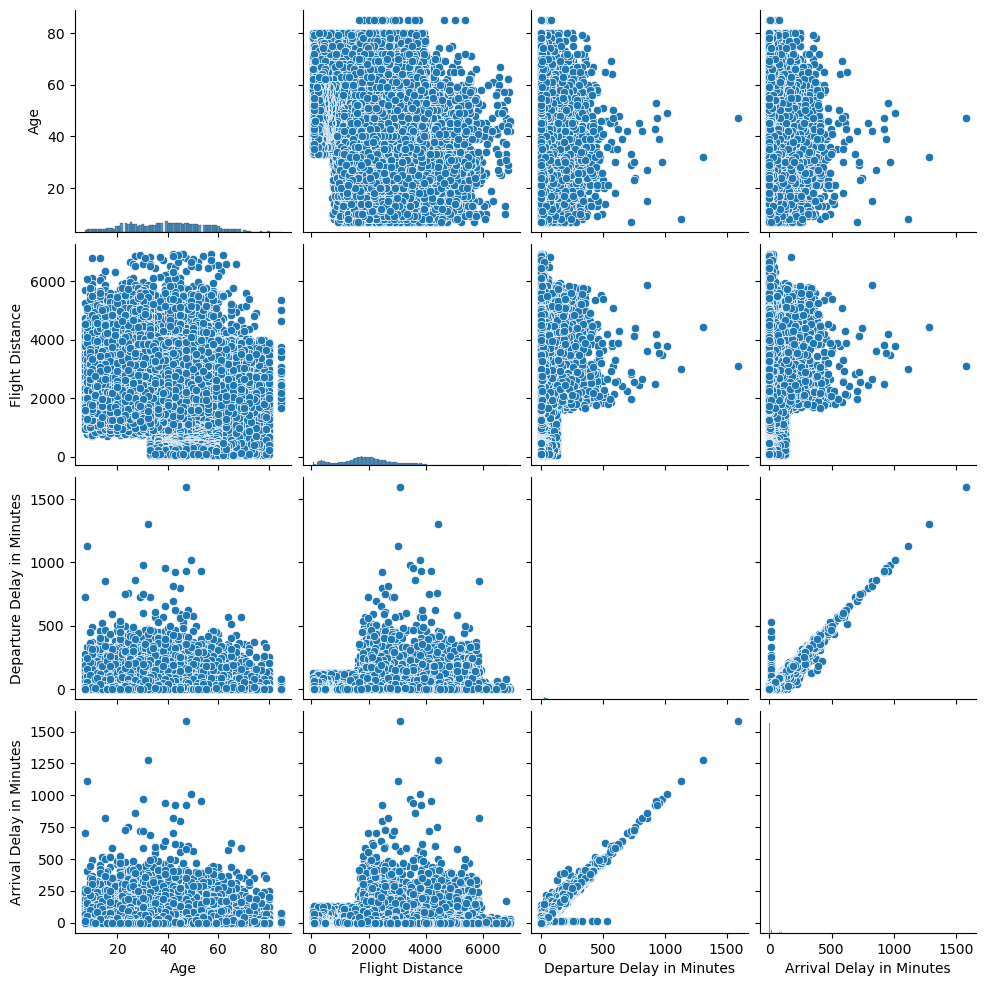

In [20]:
# Explore relationships between numerical columns
sns.pairplot(numerical[numerical.columns.tolist()])
plt.show()

C:\Users\user\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1615: UserWarning: The markers list has more values (3) than needed (2), which may not be intended.
  func(x=x, y=y, **kwargs)
C:\Users\user\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1615: UserWarning: The markers list has more values (3) than needed (2), which may not be intended.
  func(x=x, y=y, **kwargs)
C:\Users\user\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1615: UserWarning: The markers list has more values (3) than needed (2), which may not be intended.
  func(x=x, y=y, **kwargs)
C:\Users\user\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1615: UserWarning: The markers list has more values (3) than needed (2), which may not be intended.
  func(x=x, y=y, **kwargs)
C:\Users\user\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1615: UserWarning: The markers list has more values (3) than needed (2), which may not be intended.
  func(x=x, y=y, **kwargs)
C:\Users\user\anaconda3\Lib\site-packages\seaborn\axisg

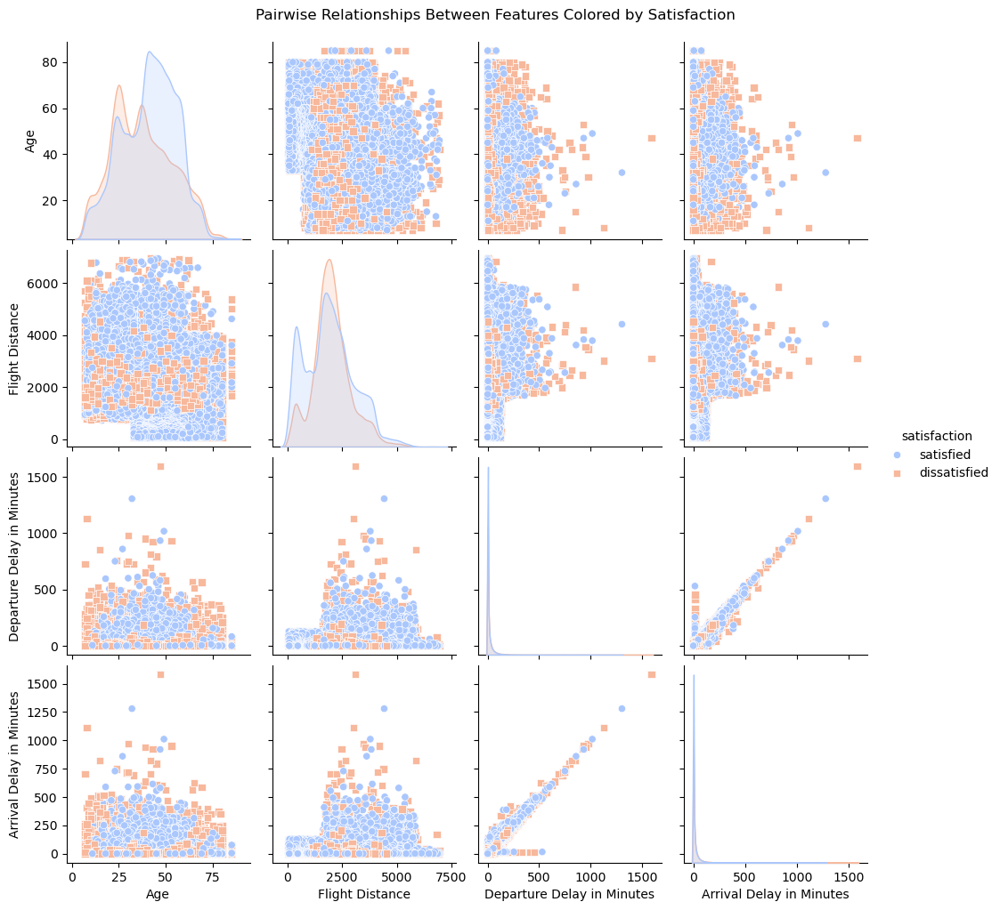

In [21]:
# Explore relationships between numerical columns and satisfaction
temp_data = numerical.copy()
temp_data['satisfaction'] = categorical['satisfaction'].values
sns.pairplot(temp_data, hue='satisfaction', palette="coolwarm", markers=["o", "s", "D"])
plt.suptitle("Pairwise Relationships Between Features Colored by Satisfaction", y=1.02)
plt.show()

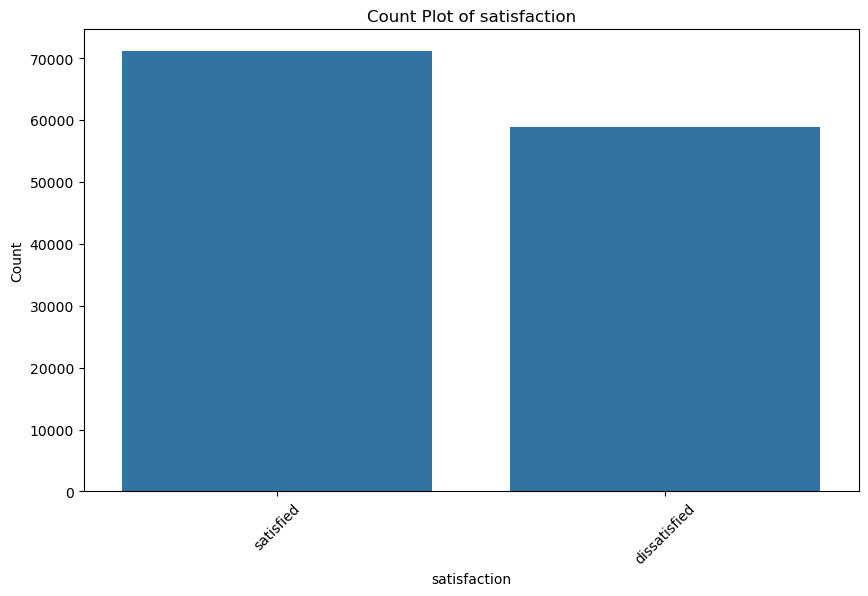

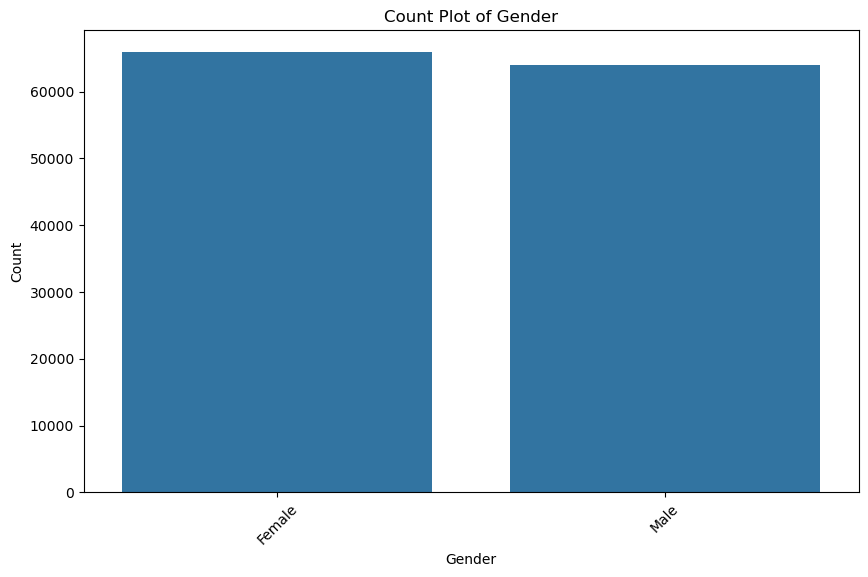

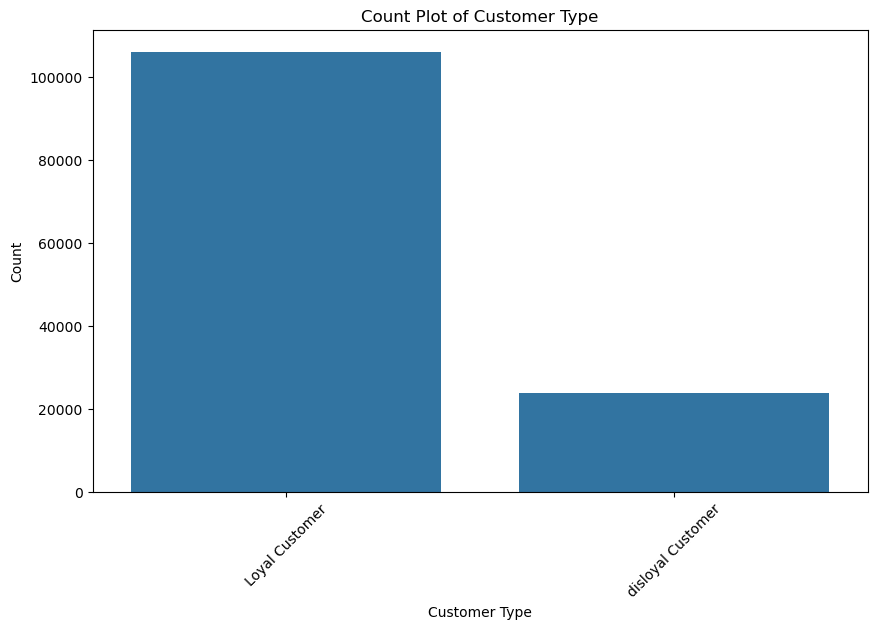

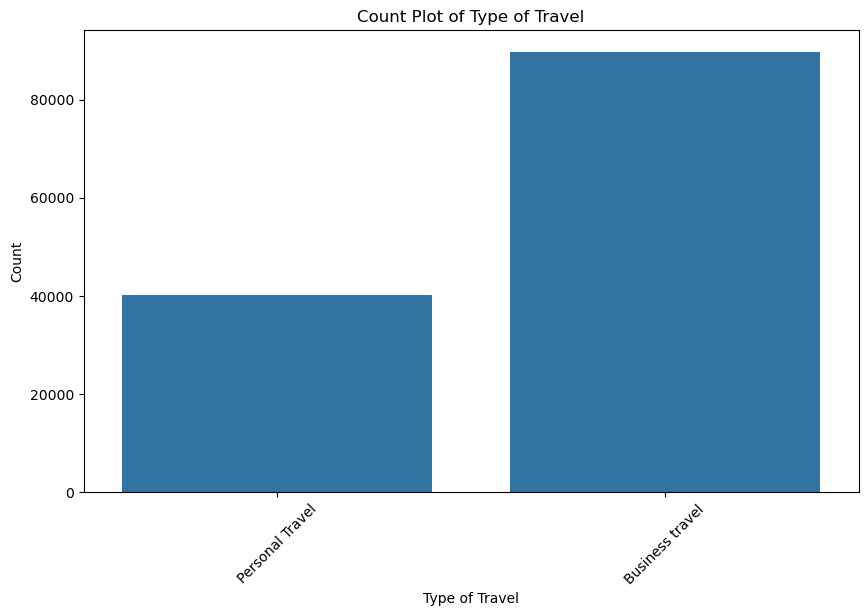

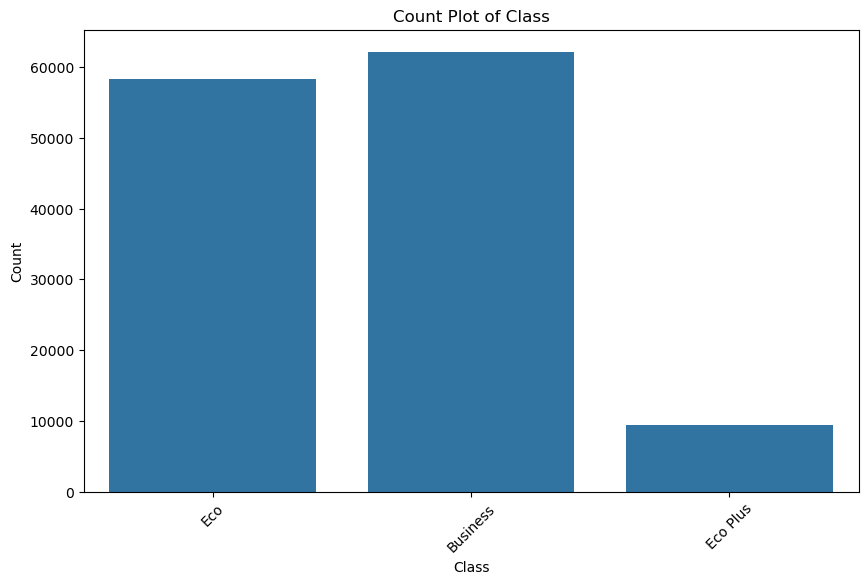

...

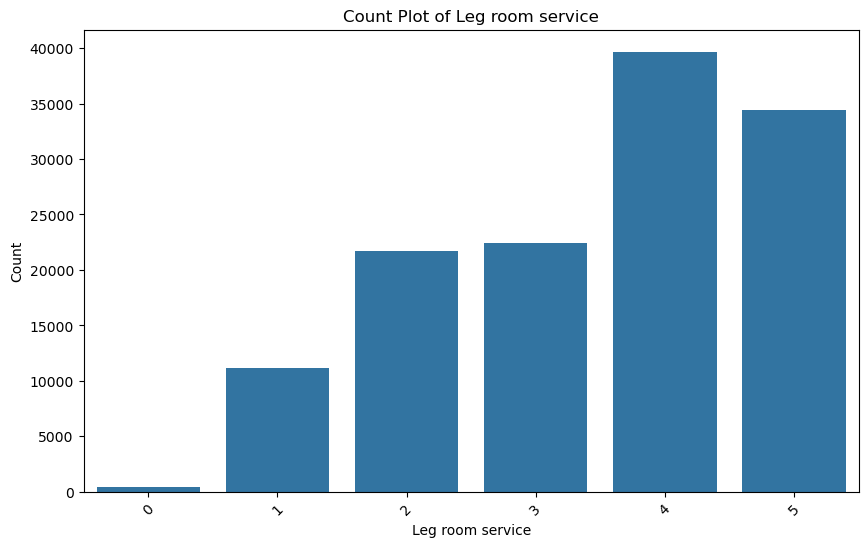

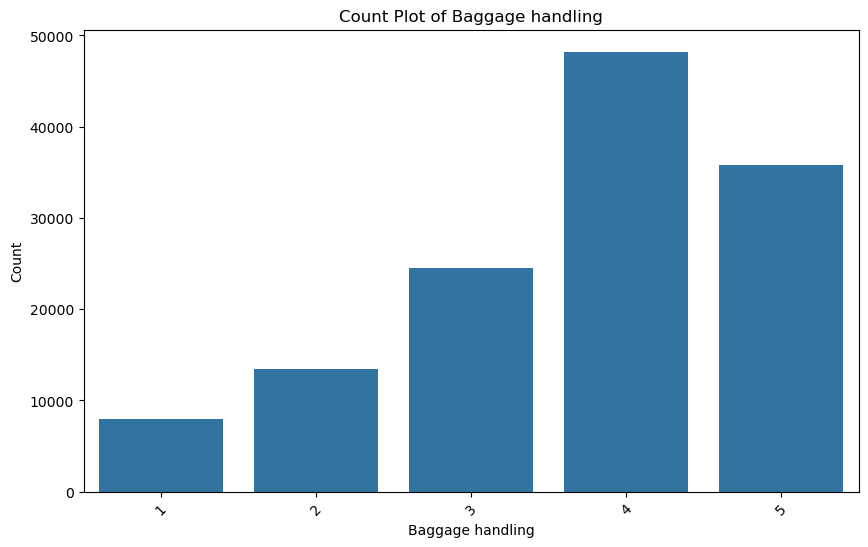

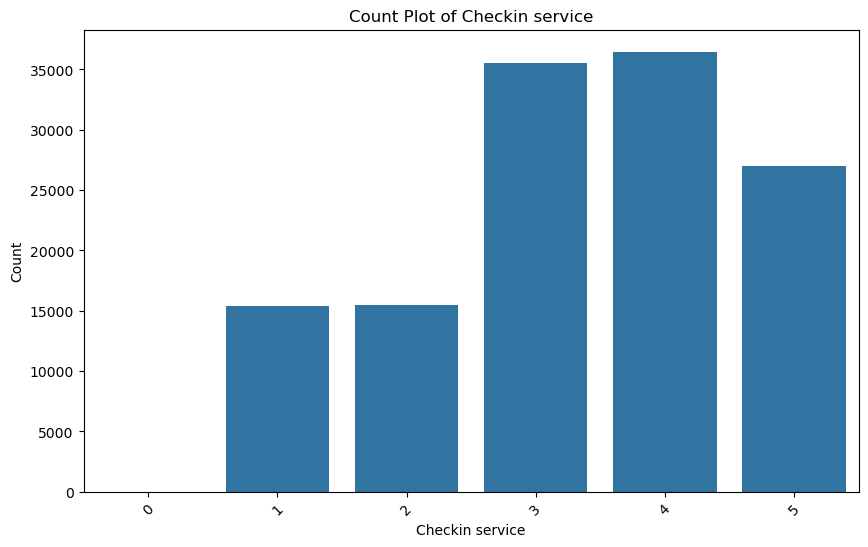

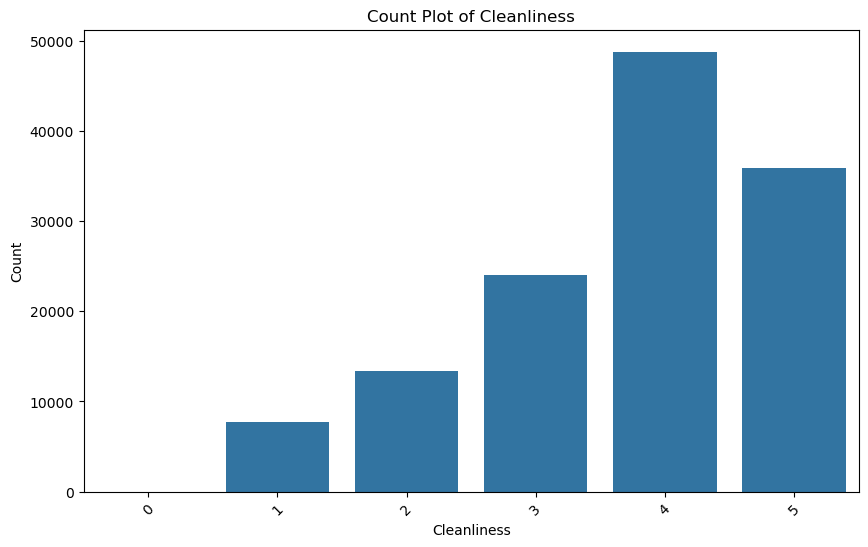

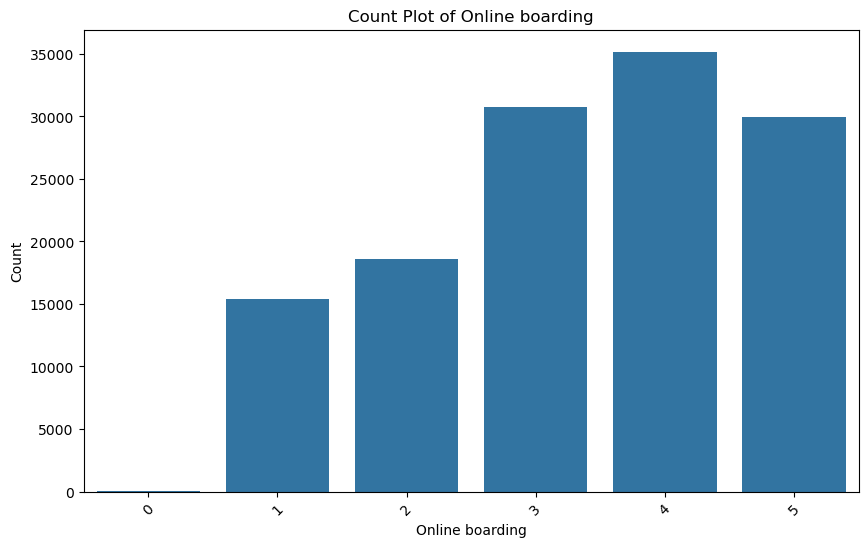

In [22]:
# Explore categorical columns using bar charts
for col in categorical.columns.tolist():
    plt.figure(figsize=(10, 6))
    sns.countplot(x=categorical[col])
    plt.title(f'Count Plot of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45) 
    plt.show()

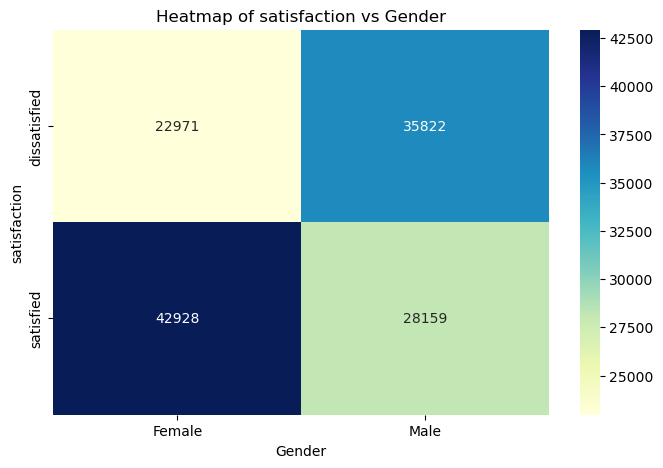

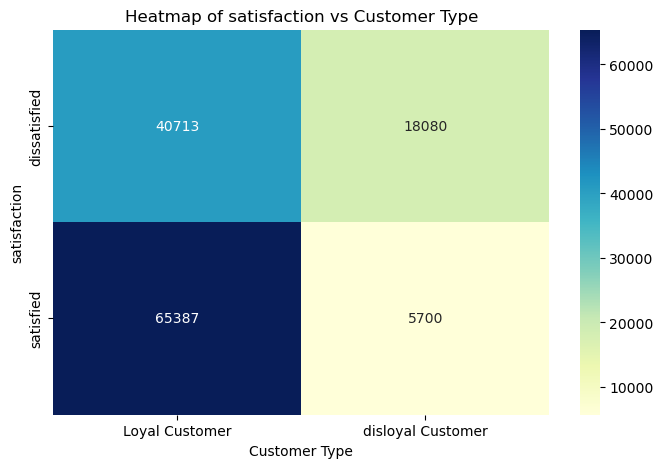

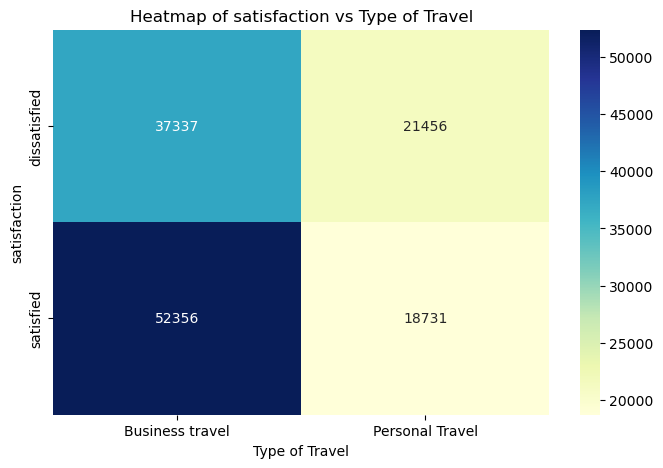

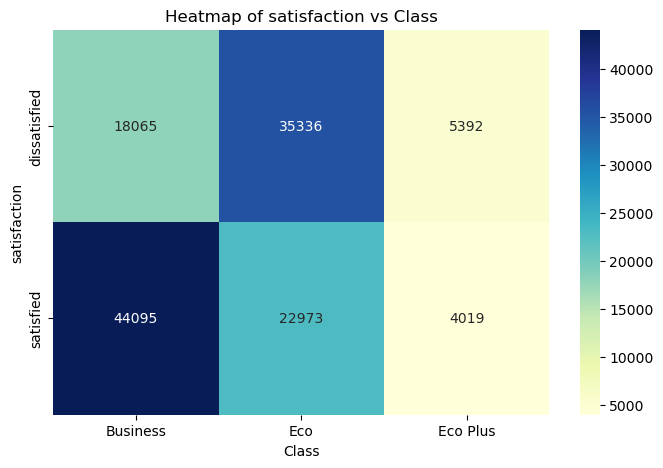

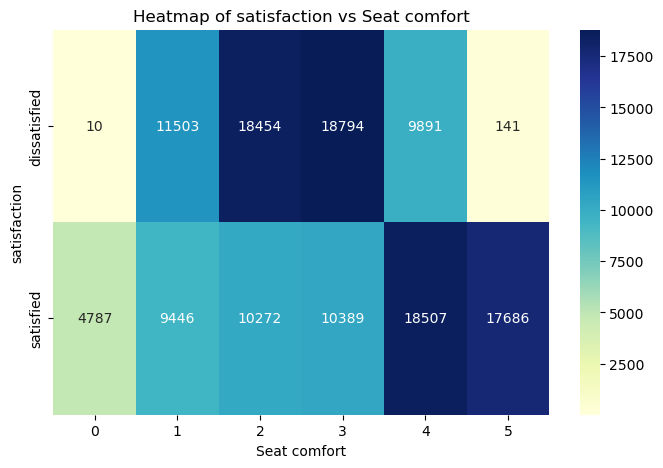

...

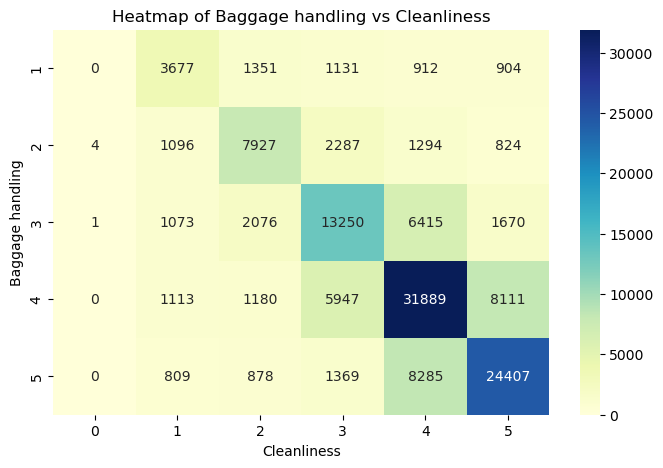

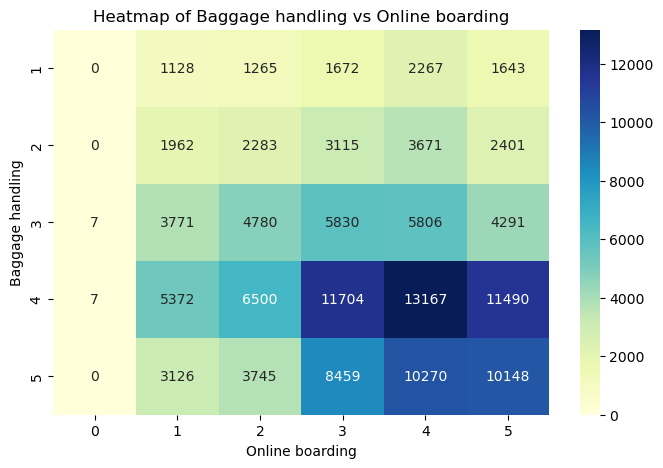

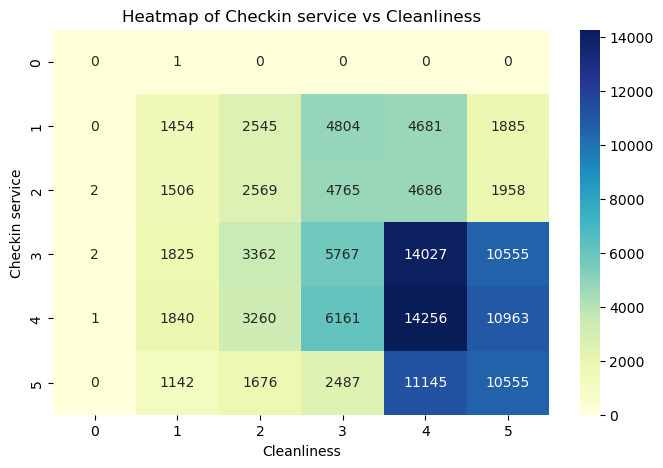

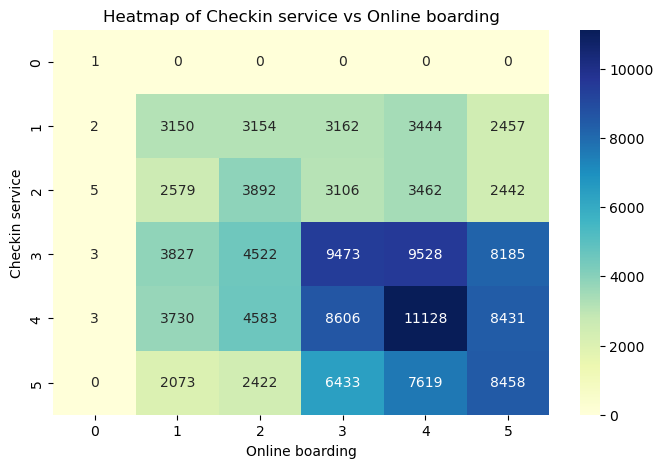

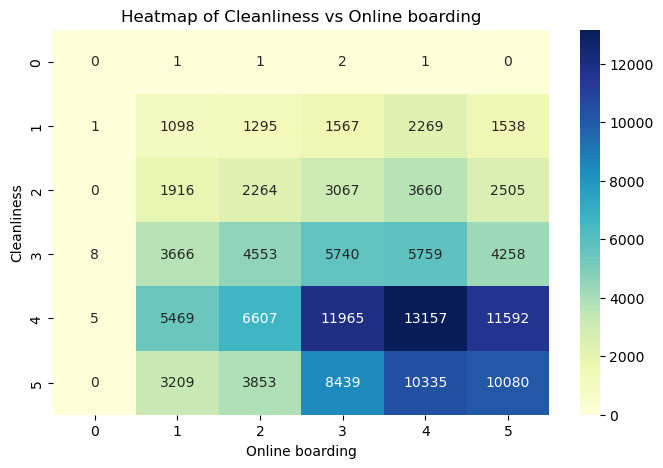

In [23]:
# Explore the relationship between categorical columns
for (col1, col2) in itertools.combinations(categorical, 2):
    contingency_table = pd.crosstab(categorical[col1], categorical[col2])
    plt.figure(figsize=(8, 5))
    sns.heatmap(contingency_table, annot=True, fmt="d", cmap="YlGnBu")
    plt.title(f"Heatmap of {col1} vs {col2}")
    plt.xlabel(col2)
    plt.ylabel(col1)
    plt.show()

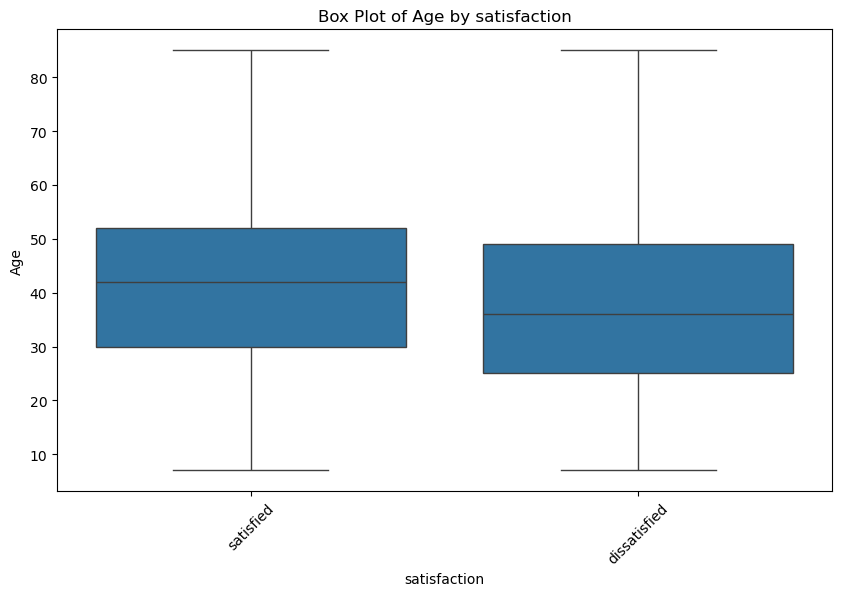

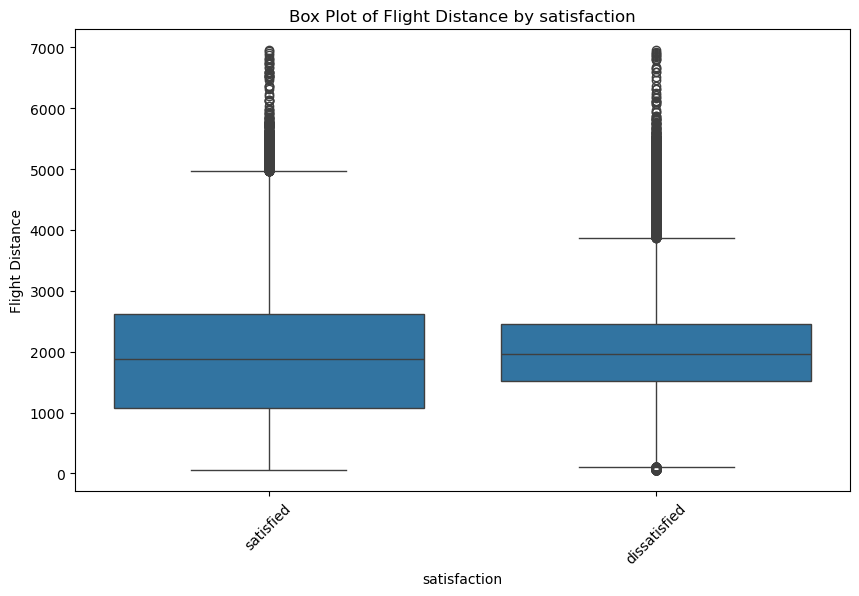

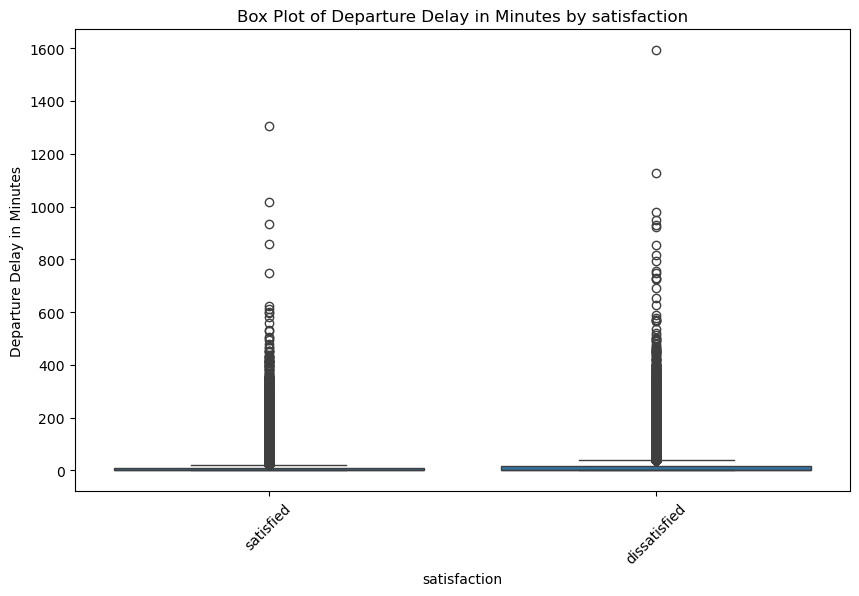

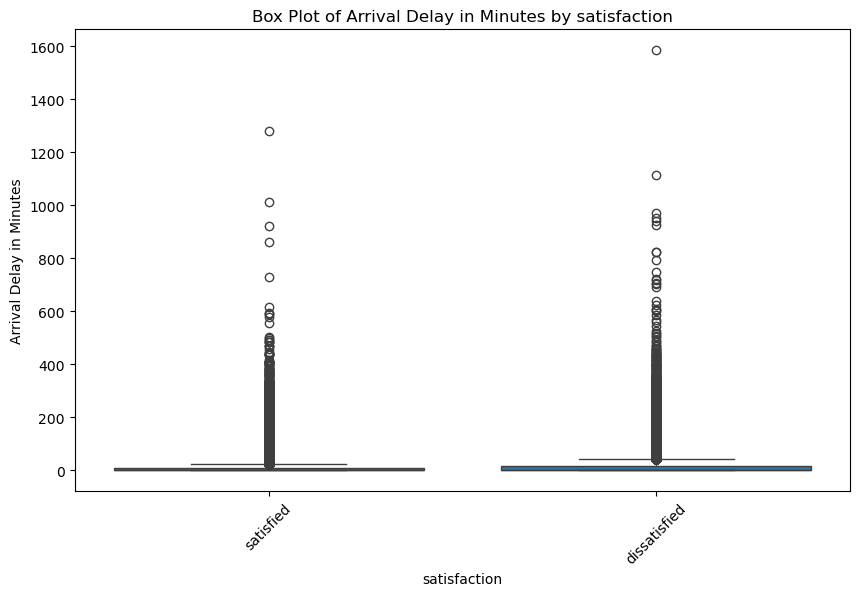

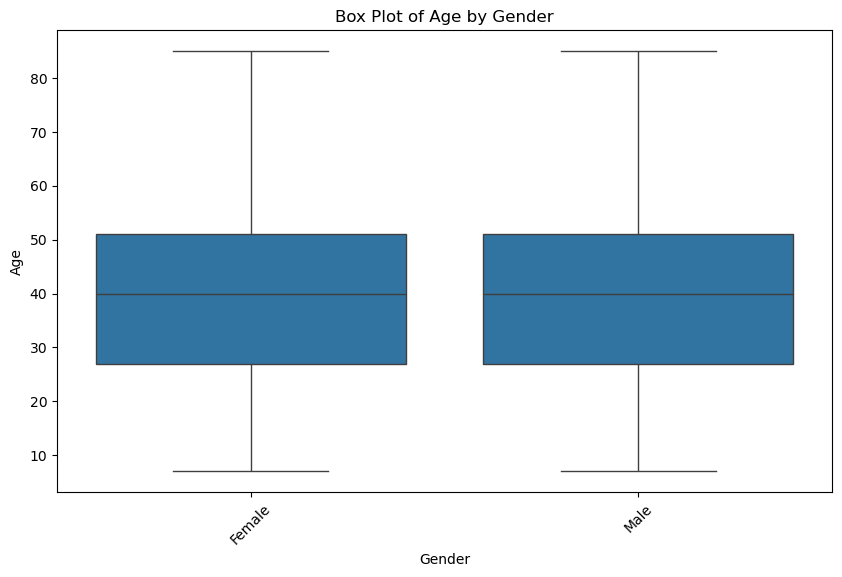

...

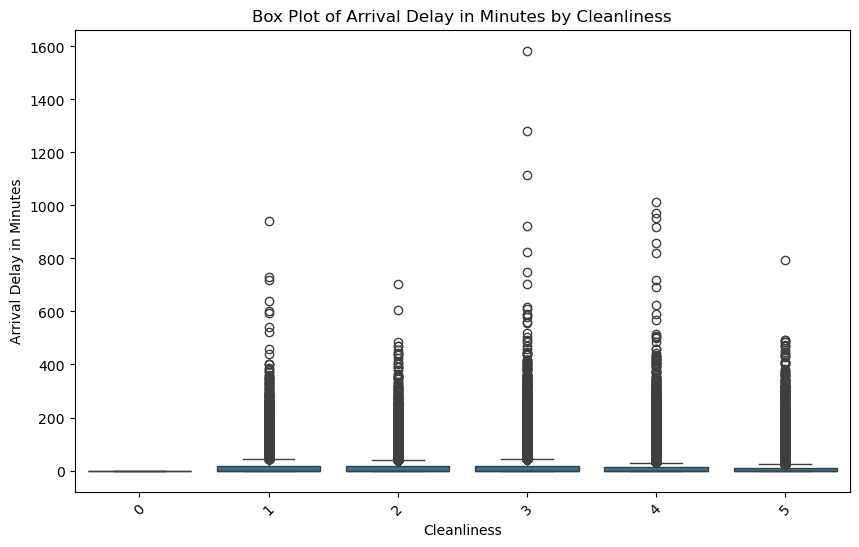

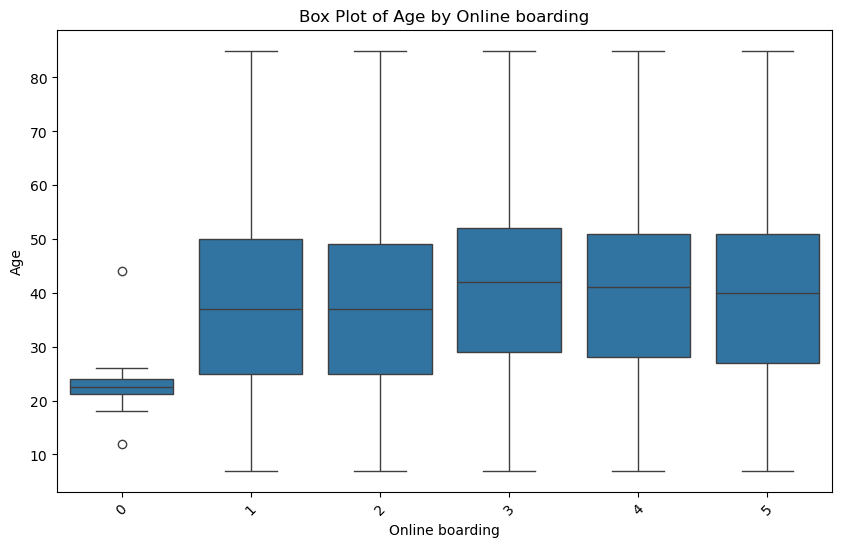

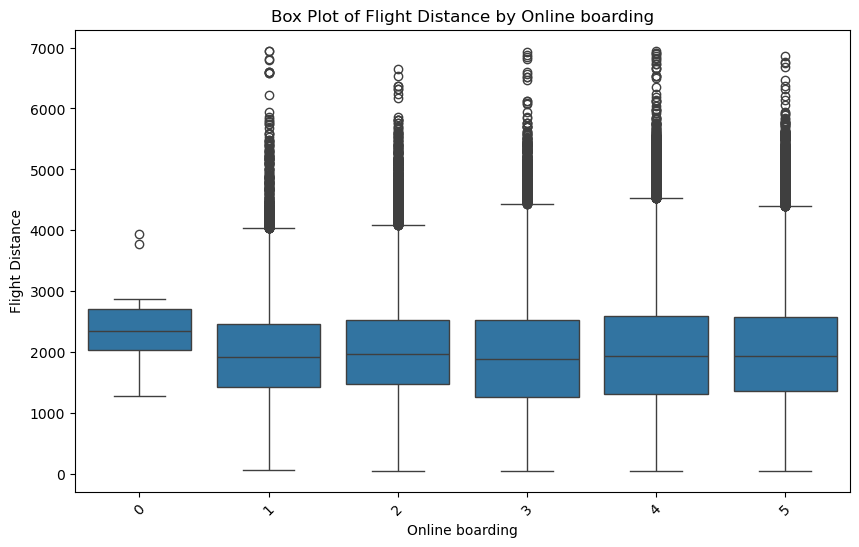

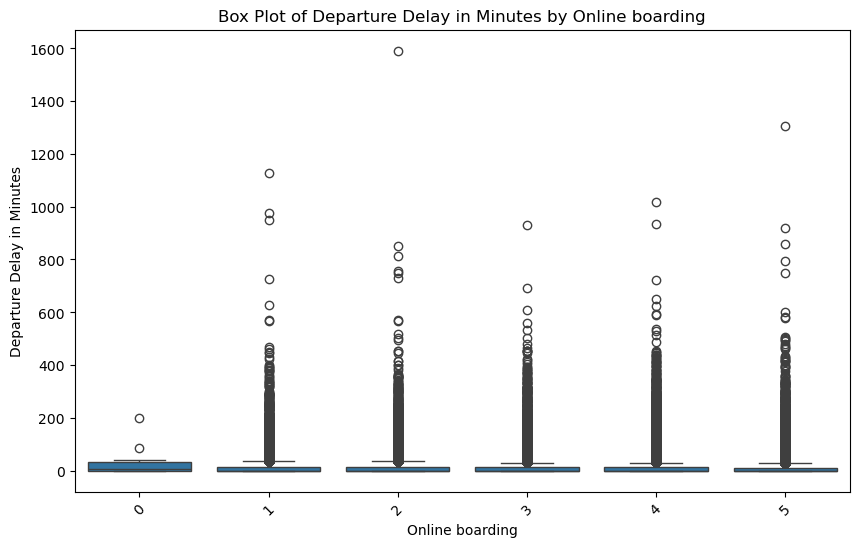

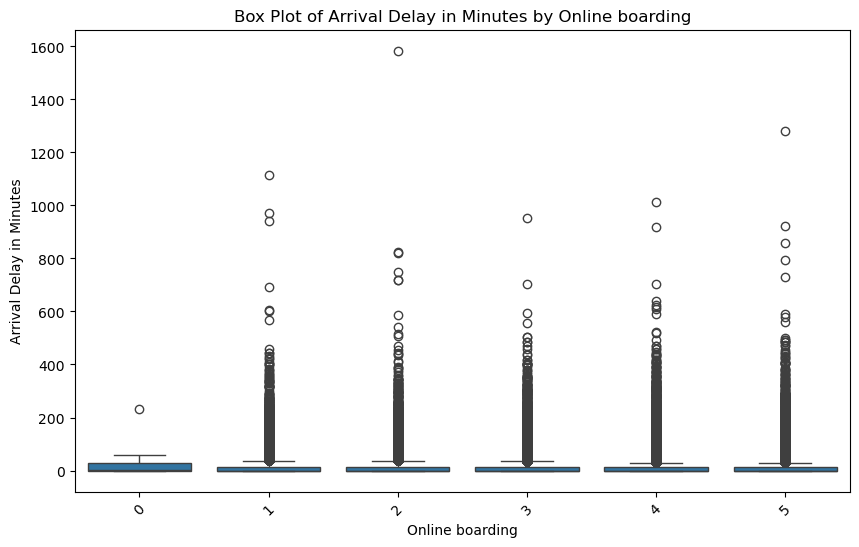

In [24]:
# Explore the relationships between categorical and numerical columns
for cat_col in categorical.columns.tolist():
    for num_col in numerical.columns.tolist():
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=categorical[cat_col], y=numerical[num_col])
        plt.title(f'Box Plot of {num_col} by {cat_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.xticks(rotation=45)
        plt.show()

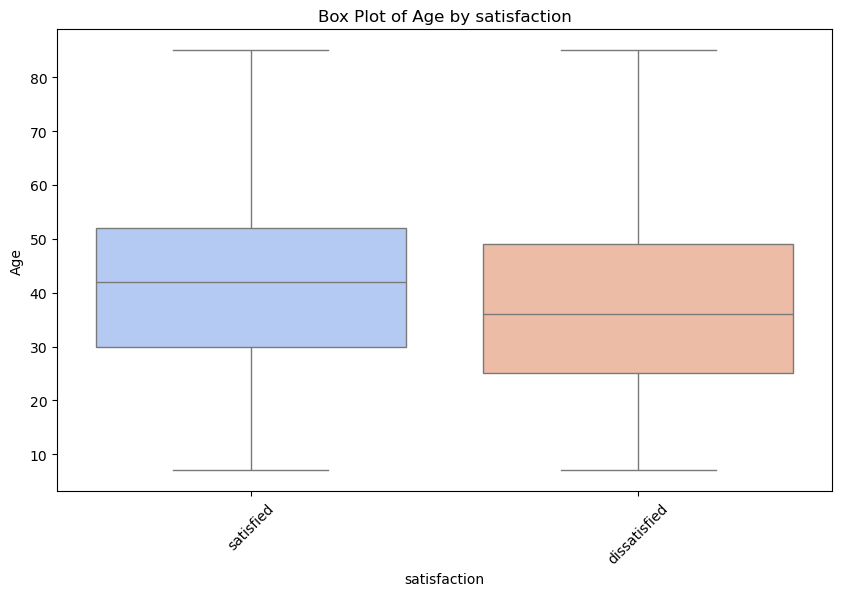

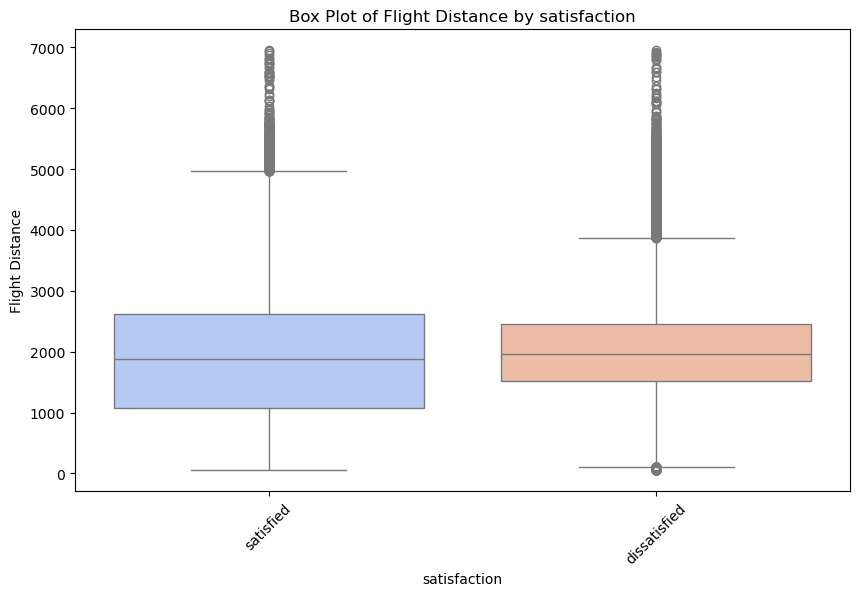

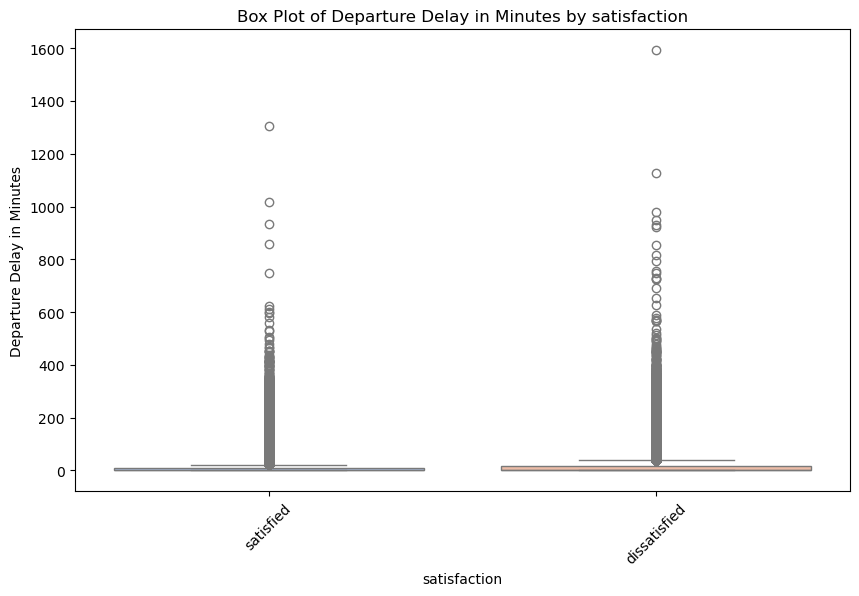

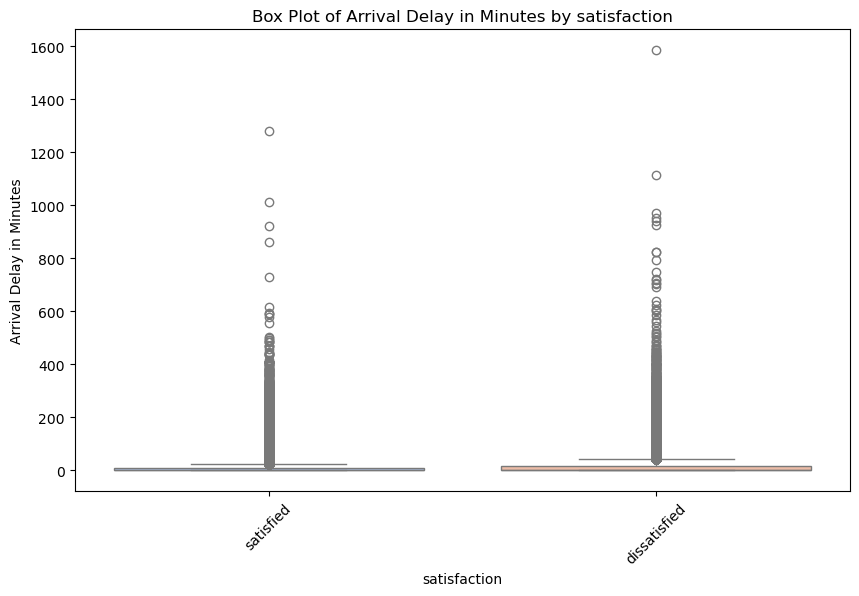

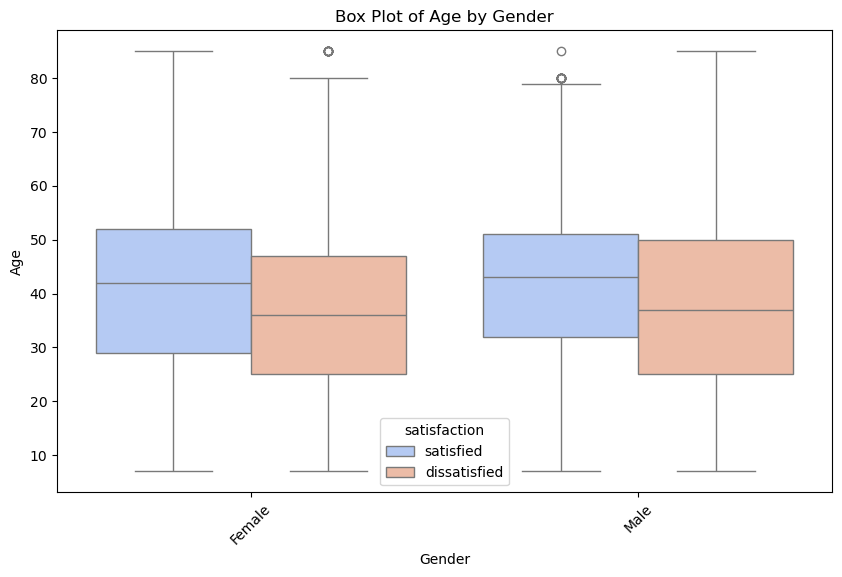

...

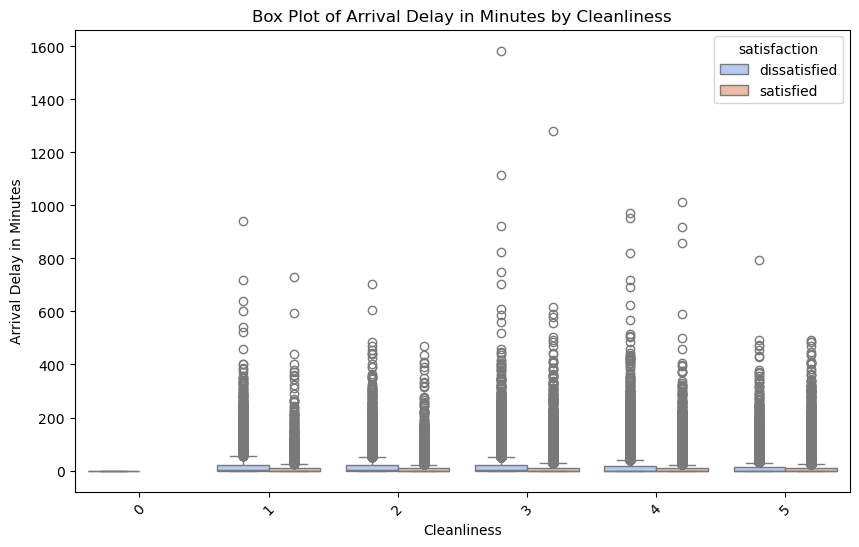

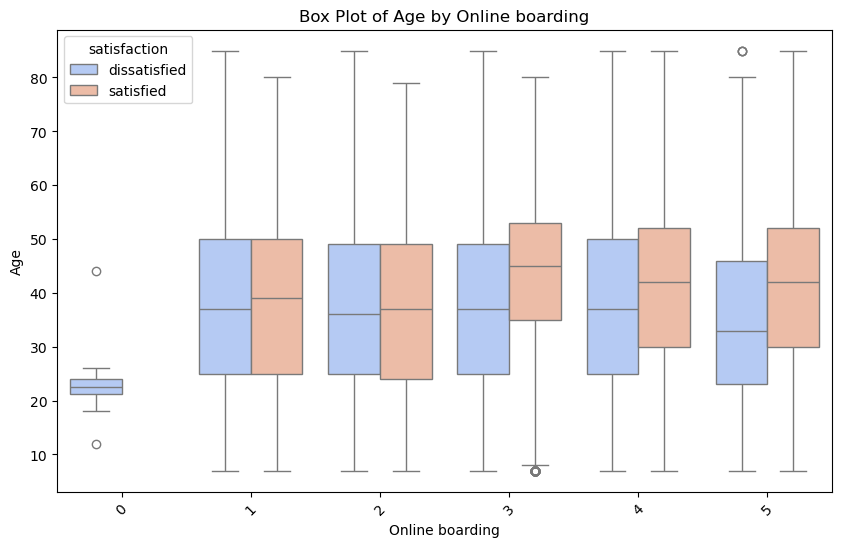

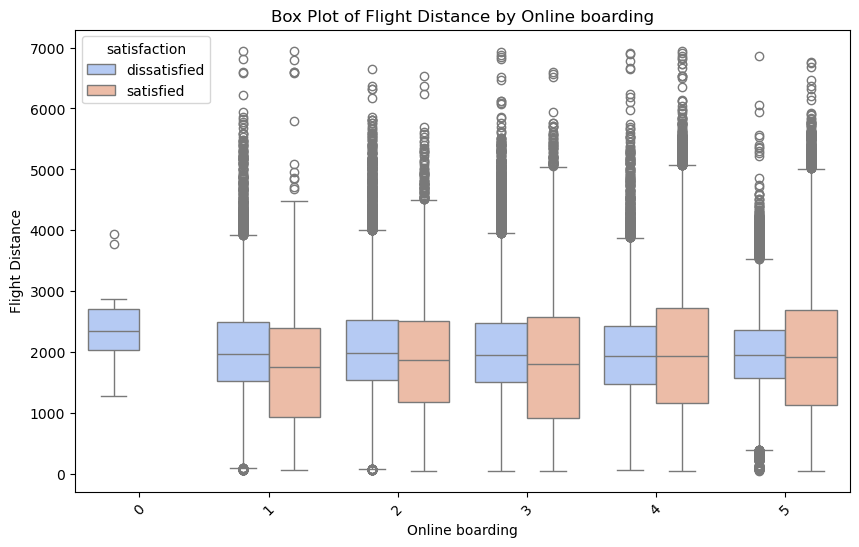

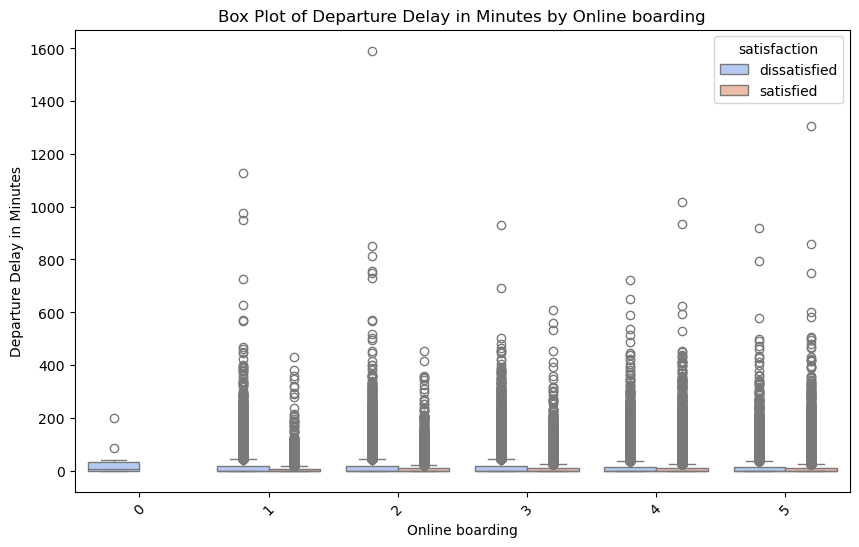

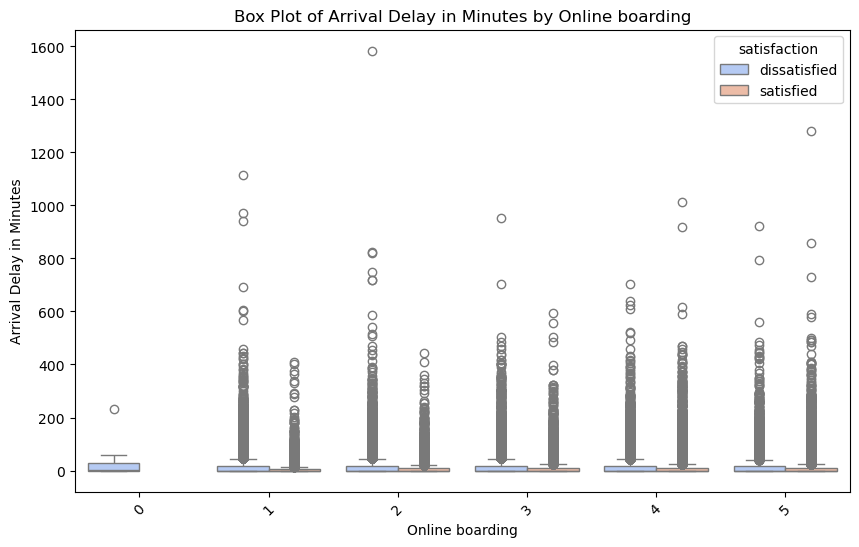

In [25]:
# Explore the relationships between categorical and numerical columns and satisfaction
for cat_col in categorical.columns.tolist():
    for num_col in numerical.columns.tolist():
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=categorical[cat_col], y=numerical[num_col], hue=categorical['satisfaction'], palette="coolwarm")
        plt.title(f'Box Plot of {num_col} by {cat_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.xticks(rotation=45)
        plt.show()


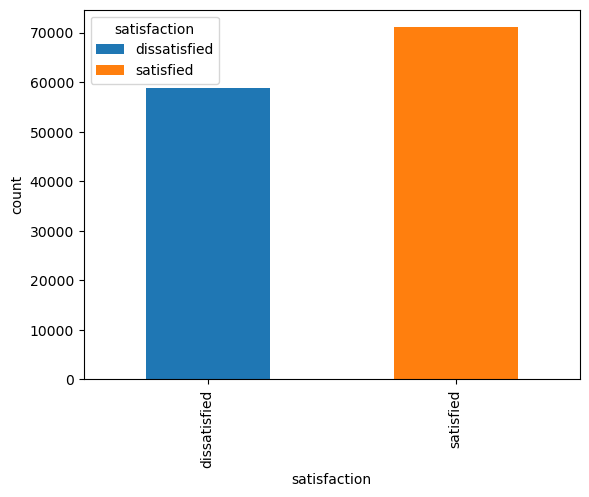

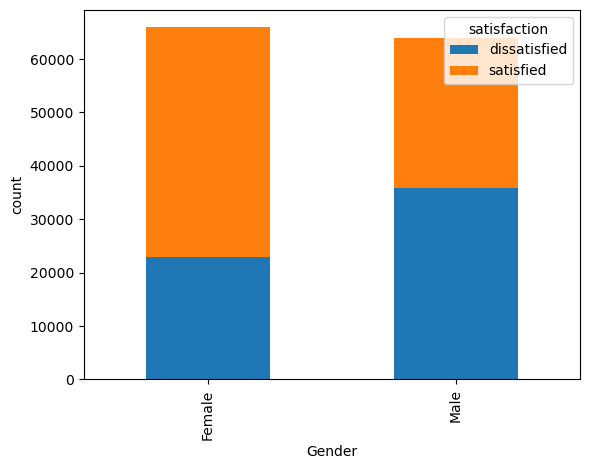

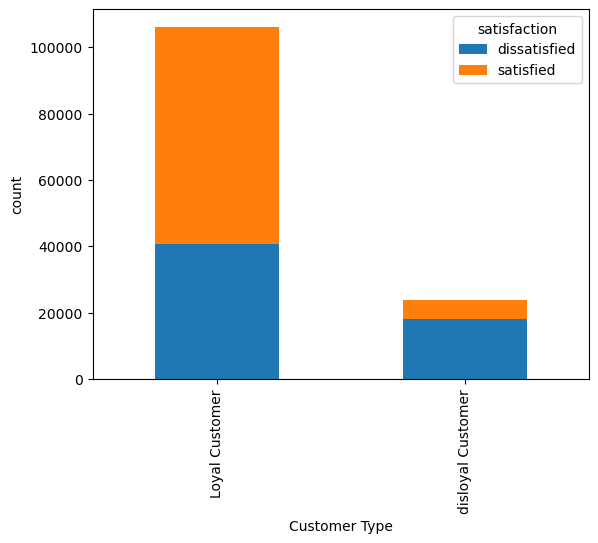

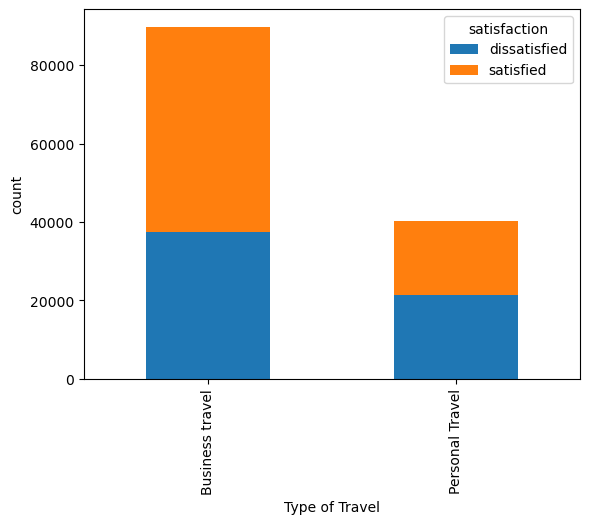

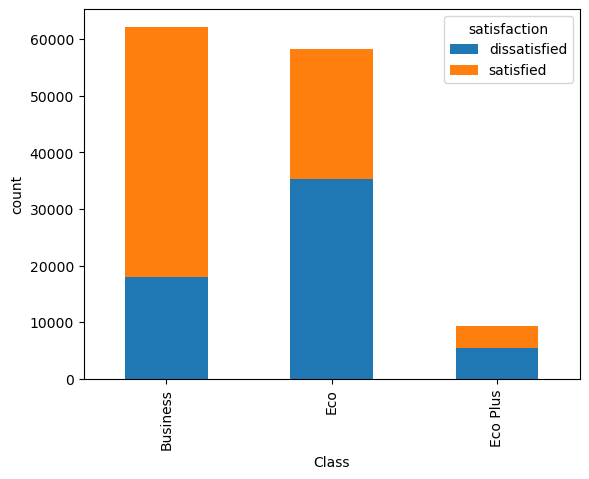

...

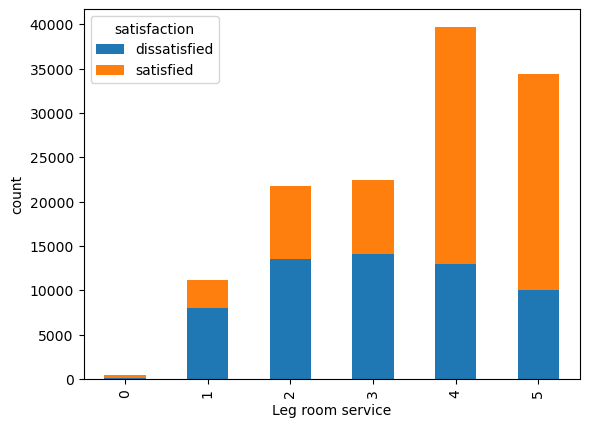

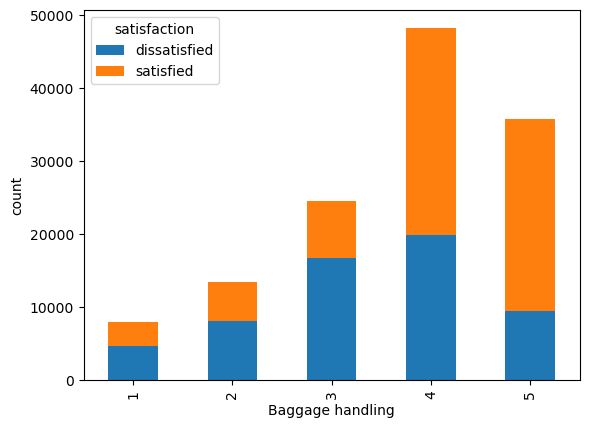

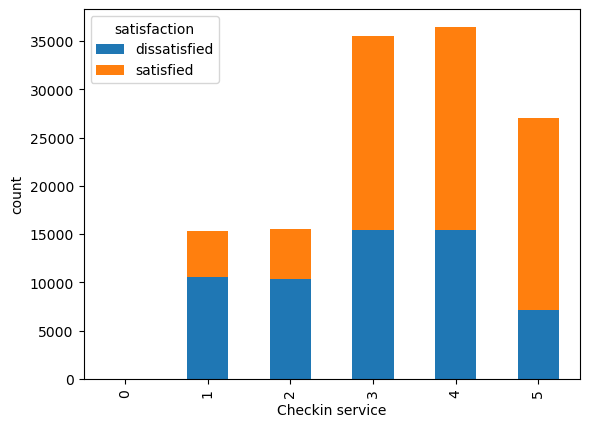

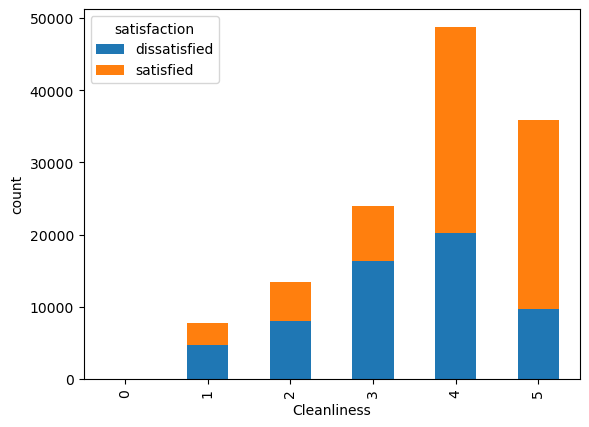

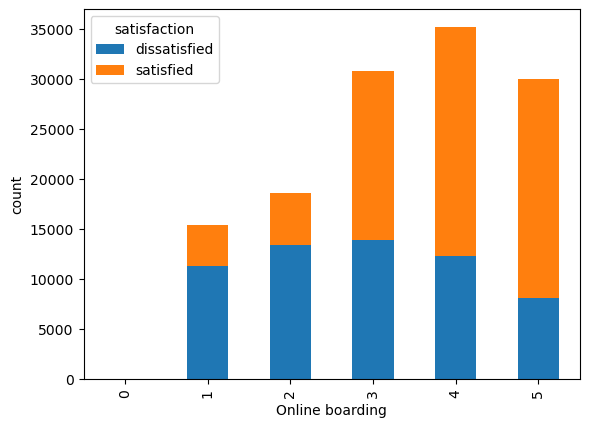

In [26]:
# Explore the realtionships between categorical columns and the target variable(satisfaction)
for cat in categorical.columns.tolist():
    contingency_table = pd.crosstab(categorical[cat], categorical['satisfaction'])
    contingency_table.plot(kind= "bar", stacked=True)
    plt.ylabel("count")
    plt.show()

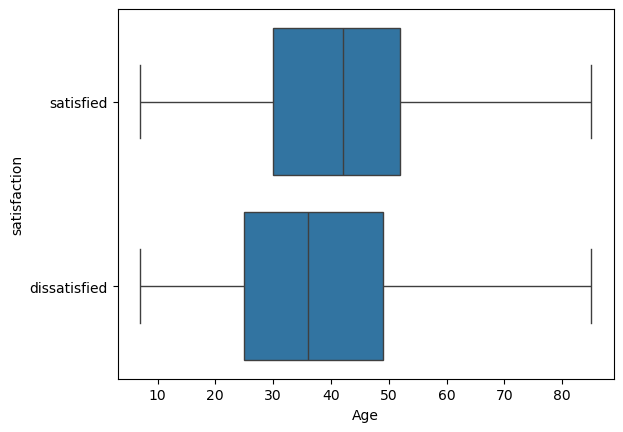

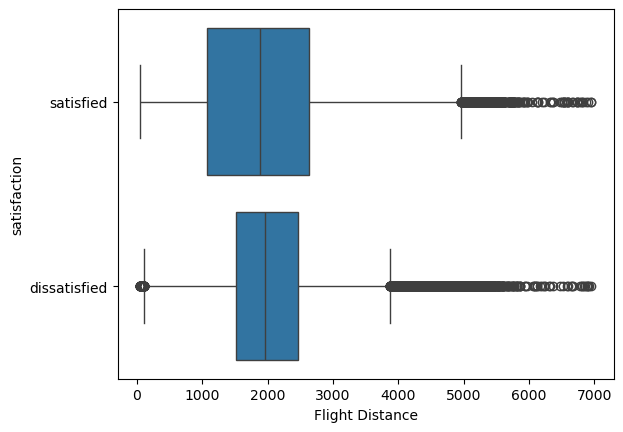

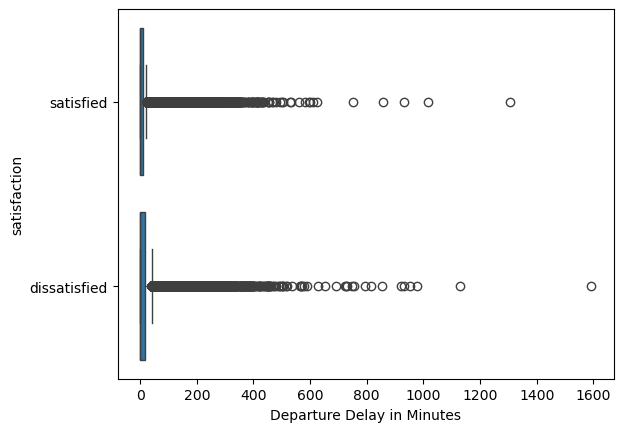

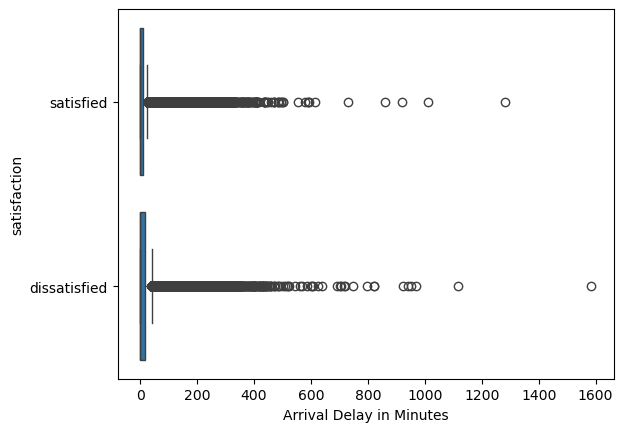

In [27]:
# Explore the relationship between numerical features with the target variable(satisfaction)
for feature in numerical.columns.tolist():
    sns.boxplot(x=feature, y=categorical['satisfaction'], data=numerical)
    plt.show()

### Feature Engineering

In [29]:
# Calculate chi-square scores for the categorical columns with satsfaction
for feature in categorical.columns.tolist():
    contingency_table = pd.crosstab(categorical[feature], data['satisfaction'])
    chi2, p, dof, expected = stats.chi2_contingency(contingency_table)
    print(feature)
    print("Chi-Square:", chi2)
    print("p-value:", p)

satisfaction
Chi-Square: 129875.96386784426
p-value: 0.0
Gender
Chi-Square: 5849.476393129708
p-value: 0.0
Customer Type
Chi-Square: 11117.536034981524
p-value: 0.0
Type of Travel
Chi-Square: 1549.3963976645564
p-value: 0.0
Class
Chi-Square: 12671.683816044482
p-value: 0.0
Seat comfort
Chi-Square: 28685.135019474306
p-value: 0.0
Departure/Arrival time convenient
Chi-Square: 210.03846399782884
p-value: 2.01921365457392e-43
Food and drink
Chi-Square: 9124.158213112665
p-value: 0.0
Gate location
Chi-Square: 2642.495014493794
p-value: 0.0
Inflight wifi service
Chi-Square: 7782.2942500368235
p-value: 0.0
Inflight entertainment
Chi-Square: 53171.3649262775
p-value: 0.0
Online support
Chi-Square: 24359.061215020127
p-value: 0.0
Ease of Online booking
Chi-Square: 26797.453655765858
p-value: 0.0
On-board service
Chi-Square: 16975.44701366252
p-value: 0.0
Leg room service
Chi-Square: 14654.190379649002
p-value: 0.0
Baggage handling
Chi-Square: 12508.660858267373
p-value: 0.0
Checkin service
Chi-

In [30]:
# Further calculate the cramer's v rule for the categorical columns with satisfaction
# sources from https://www.geeksforgeeks.org/python-pearsons-chi-square-test/ 
cramers_v_results = {}

# Loop through all columns in the categorical dataFrame
for column in categorical.columns.tolist():
    if column != "satisfaction":
        contingency_table = pd.crosstab(categorical["satisfaction"], categorical[column])
        
        # Calculate chi-squared test statistic, sample size, and minimum of rows and columns
        chi2 = stats.chi2_contingency(contingency_table, correction=False)[0]
        n = contingency_table.sum().sum()  # Total number of observations
        minimum_dimension = min(contingency_table.shape) - 1  
        
        # Calculate Cramér's V
        cramers_v = np.sqrt(chi2 / (n * minimum_dimension))
        
        # Store the result in the dictionary
        cramers_v_results[column] = cramers_v

# Print the results
for col, value in cramers_v_results.items():
    print(f"Cramér's V between satisfaction and '{col}': {value:.4f}")

Cramér's V between satisfaction and 'Gender': 0.2122
Cramér's V between satisfaction and 'Customer Type': 0.2926
Cramér's V between satisfaction and 'Type of Travel': 0.1092
Cramér's V between satisfaction and 'Class': 0.3124
Cramér's V between satisfaction and 'Seat comfort': 0.4700
Cramér's V between satisfaction and 'Departure/Arrival time convenient': 0.0402
Cramér's V between satisfaction and 'Food and drink': 0.2650
Cramér's V between satisfaction and 'Gate location': 0.1426
Cramér's V between satisfaction and 'Inflight wifi service': 0.2448
Cramér's V between satisfaction and 'Inflight entertainment': 0.6398
Cramér's V between satisfaction and 'Online support': 0.4331
Cramér's V between satisfaction and 'Ease of Online booking': 0.4542
Cramér's V between satisfaction and 'On-board service': 0.3615
Cramér's V between satisfaction and 'Leg room service': 0.3359
Cramér's V between satisfaction and 'Baggage handling': 0.3103
Cramér's V between satisfaction and 'Checkin service': 0.2

In [31]:
# Drop columns based on the cramer's v rule results
columns_to_drop = [
    'Departure/Arrival time convenient',  # Dropped due to a very weak association (Cramér's V: 0.0402). This indicates that the timing of departures/arrivals does not significantly influence customer satisfaction.
    
    'Type of Travel',                     # Weak association (Cramér's V: 0.1092). This variable does not provide significant insight into how travel type impacts satisfaction levels.
    
    'Gate location',                      # Weak association (Cramér's V: 0.1426). Gate location has minimal impact on customer satisfaction, which suggests it may not be a critical factor in understanding overall customer experiences.
    
    'Inflight wifi service',              # Weak association (Cramér's V: 0.2448). This value indicates that while there may be some relation, it is not strong enough to justify its inclusion, especially when stronger predictors are available.
    
    'Food and drink',                     # Weak association (Cramér's V: 0.2650). This suggests that food and drink options do not significantly affect overall satisfaction, limiting its usefulness for deeper insights.
    
    'On-board service',                   # Moderate association (Cramér's V: 0.3615). Although this variable shows some correlation, there are other variables with stronger associations that are more critical for understanding satisfaction.
    
    'Leg room service',                   # Moderate association (Cramér's V: 0.3359). Similar to On-board service, while it has a moderate association, it is not as strong as other predictors, indicating a lower priority for analysis.
    
    'Baggage handling',                   # Moderate association (Cramér's V: 0.3103). This association is not robust enough to warrant inclusion, particularly when other variables offer greater insights into customer satisfaction.
    
    'Checkin service',                    # Weak association (Cramér's V: 0.2810). This value indicates that check-in service is not significantly affecting customer satisfaction levels and can, therefore, be excluded.
    
    'Cleanliness',                        # Weak to moderate association (Cramér's V: 0.3049). Although it shows some relevance, it does not provide substantial insights when stronger factors are available.
    
    'Online boarding'                     # Moderate association (Cramér's V: 0.3505). Although it's somewhat relevant, other variables provide clearer, stronger links to customer satisfaction and should be prioritized over this variable.
]


In [32]:
# Drop columns
categorical.drop(columns_to_drop, axis = 1, inplace = True)

In [33]:
# Columns to drop
numerical.drop(["Departure Delay in Minutes", "Arrival Delay in Minutes"], axis = 1, inplace = True)

In [34]:
# Add remaining features in numerical and categorical columns
data = pd.concat([numerical, categorical], axis=1)

In [35]:
data

,Age,Flight Distance,satisfaction,Gender,Customer Type,Class,Seat comfort,Inflight entertainment,Online support,Ease of Online booking
0,65.0,265.0,satisfied,Female,Loyal Customer,Eco,0,4,2,3
1,47.0,2464.0,satisfied,Male,Loyal Customer,Business,0,2,2,3
2,15.0,2138.0,satisfied,Female,Loyal Customer,Eco,0,0,2,2
3,60.0,623.0,satisfied,Female,Loyal Customer,Eco,0,4,3,1
4,70.0,354.0,satisfied,Female,Loyal Customer,Eco,0,3,4,2
...,...,...,...,...,...,...,...,...,...,...
129875,29.0,1731.0,satisfied,Female,disloyal Customer,Eco,5,5,2,2
129876,63.0,2087.0,dissatisfied,Male,disloyal Customer,Business,2,1,1,3
129877,69.0,2320.0,dissatisfied,Male,disloyal Customer,Eco,3,2,2,4
129878,66.0,2450.0,dissatisfied,Male,disloyal Customer,Eco,3,2,2,3


### Label Encoding

In [37]:
# Encode the categorical data manually to know what each number represent
gender = {'Male': 0, 'Female': 1}
class_1 = {'Business': 0, 'Eco': 1, 'Eco Plus': 2}
customer_type = {'Loyal Customer': 0, 'disloyal Customer': 1}
satisfaction = {'satisfied': 0, 'dissatisfied': 1}


data['satisfaction'] = data['satisfaction'].map(satisfaction)
data['Gender'] = data['Gender'].map(gender)
data['Customer Type'] = data['Customer Type'].map(customer_type)
data['Class'] = data['Class'].map(class_1)

In [38]:
data

,Age,Flight Distance,satisfaction,Gender,Customer Type,Class,Seat comfort,Inflight entertainment,Online support,Ease of Online booking
0,65.0,265.0,0,1,0,1,0,4,2,3
1,47.0,2464.0,0,0,0,0,0,2,2,3
2,15.0,2138.0,0,1,0,1,0,0,2,2
3,60.0,623.0,0,1,0,1,0,4,3,1
4,70.0,354.0,0,1,0,1,0,3,4,2
...,...,...,...,...,...,...,...,...,...,...
129875,29.0,1731.0,0,1,1,1,5,5,2,2
129876,63.0,2087.0,1,0,1,0,2,1,1,3
129877,69.0,2320.0,1,0,1,1,3,2,2,4
129878,66.0,2450.0,1,0,1,1,3,2,2,3


In [39]:
# Separate features from target variable
X, y =automate_feature_selection(data, "satisfaction")

In [40]:
# Normalize the features
# Sourced from Dr. Isaac's code
X_mean = X.mean(axis=0)
X_std = X.std(axis=0)
X_norm = (X - X_mean) / X_std
print(f"X_mean:{X_mean}")
print(f"X_std:{X_std}")

X_mean:[3.94279566e+01 1.98140905e+03 5.07383739e-01 1.83092085e-01
 5.93863566e-01 2.83859717e+00 3.38347706e+00 3.51970280e+00
 3.47210502e+00]
X_std:[1.51193017e+01 1.02711165e+03 4.99945477e-01 3.86741999e-01
 6.21375906e-01 1.39297788e+00 1.34605396e+00 1.30650566e+00
 1.30555462e+00]


#### Splitting data into training and testing

In [42]:
# Split dataset into training and testing sets
from sklearn.model_selection import train_test_split
Xtrain,Xtest,Ytrain,Ytest=train_test_split(X_norm,y,test_size=0.2,random_state=42)

### Building of Model

#### Logistic Regression

In [45]:
## Sourced from Dr. Isaac Nyantakyi's code
class LogisticRegressionModel:
    def __init__(self, alpha=0.01, num_iterations=1000):
        self.alpha = alpha
        self.num_iterations = num_iterations
        self.theta = None
        self.cost_history = []

    def sigmoid(self, z):
        # Sigmoid function to map predictions to probabilities (range 0 to 1).
        return 1 / (1 + np.exp(-z))

    def compute_cost(self, X, y, theta):
        # Compute the logistic regression cost function.
        m = len(y)  # Number of training samples
        h = self.sigmoid(np.dot(X, theta))  # Predicted probabilities using sigmoid
        epsilon = 1e-5  # Small constant to prevent log(0)
        # Cross-entropy cost function
        cost = -(1/m) * np.sum(y * np.log(h + epsilon) + (1 - y) * np.log(1 - h + epsilon))
        return cost

    def gradient_descent(self, X, y):
        # Perform gradient descent to learn theta values (weights).
        m = len(y)  # Number of training samples
        theta = np.zeros(X.shape[1])  # Initialize weights to zero
        cost_history = []  # To store cost after each iteration

        # Loop over the specified number of iterations
        for _ in range(self.num_iterations):
            h = self.sigmoid(np.dot(X, theta))  # Calculate predictions
            gradient = (1/m) * np.dot(X.T, (h - y))  # Compute gradient
            theta -= self.alpha * gradient  # Update weights
            cost = self.compute_cost(X, y, theta)  # Calculate and store cost for this iteration
            cost_history.append(cost)

        self.theta = theta  # Final optimized weights
        self.cost_history = cost_history  # Cost history over iterations

    def fit(self, X, y):
        # Train the logistic regression model by running gradient descent.
        self.gradient_descent(X, y)

    def predict(self, X):
        # Predict probabilities and binary class labels for the given input data.
        probabilities = self.sigmoid(np.dot(X, self.theta))  # Predicted probabilities for class 1
        # Initialize an empty list for predictions
        predictions = []
        # Loop through each probability
        for prob in probabilities:
            # Append 1 if prob >= 0.5, otherwise append 0
            if prob >= 0.5:
                predictions.append(1)
            else:
                predictions.append(0)
        return predictions

In [46]:
# Create an instance of the LogisticRegressionModel
model = LogisticRegressionModel()

# Train the logistic regression model on the training data
model.fit(Xtrain, Ytrain)

# Evaluate the model's performance on the test data
predictions = model.predict(Xtest)  # Generate predictions
accuracy = np.mean(predictions == Ytest)  # Calculate accuracy as mean of correct predictions
print(f"Accuracy: {accuracy * 100:.2f}%")  # Print accuracy in percentage


Accuracy: 81.72%


#### Decision Tree Classifier

In [48]:
# sourced from https://www.youtube.com/watch?v=sgQAhG5Q7iY&ab_channel=NormalizedNerd
# Define a Node class for the decision tree
class TreeNode:
    def __init__(self, feature_index=None, threshold_value=None, left_child=None, right_child=None, node_value=None, info_gain=None):
        self.feature_index = feature_index
        self.threshold_value = threshold_value
        self.left_child = left_child
        self.right_child = right_child
        self.node_value = node_value
        self.info_gain = info_gain


# Define the Decision Tree Classifier class
class DecisionTreeClassifier:
    def __init__(self, min_samples_split=2, max_depth=2, criterion='gini'):
        self.root_node = None  # root node of the tree
        self.min_samples_split = min_samples_split
        self.max_depth = max_depth
        self.criterion = criterion  

    def build_tree(self, dataset, current_depth=0):
        features, labels = dataset[:, :-1], dataset[:, -1]  # Split data into features and labels
        num_samples, num_features = np.shape(features)

        # Check if the split is allowed by sample count and depth; find the best split if allowed
        if num_samples >= self.min_samples_split and current_depth < self.max_depth:
            best_split_info = self.get_best_split(dataset, num_samples, num_features)
            # If a good split is found, recursively build subtrees
            if best_split_info["info_gain"] > 0:
                left_subtree = self.build_tree(best_split_info["dataset_left"], current_depth + 1)
                right_subtree = self.build_tree(best_split_info["dataset_right"], current_depth + 1)
                # Create a new node with the split details
                return TreeNode(best_split_info["feature_index"], best_split_info["threshold_value"], left_subtree, right_subtree, info_gain=best_split_info["info_gain"])

        # If no further split, create a leaf node with the most common class in labels
        leaf_node_value = self.calculate_leaf_value(labels)
        return TreeNode(node_value=leaf_node_value)

    def get_best_split(self, dataset, num_samples, num_features):
        best_split_info = None
        max_info_gain = -float("inf")  
        
        # split on each feature and each unique value to find the best option
        for feature_index in range(num_features):
            feature_values = dataset[:, feature_index]
            possible_thresholds = np.unique(feature_values)  # Try each unique value as a split point
            for threshold_value in possible_thresholds:
                left_dataset, right_dataset = self.split(dataset, feature_index, threshold_value)
                if len(left_dataset) > 0 and len(right_dataset) > 0:  # Only split if both sides get data
                    all_labels = dataset[:, -1]
                    left_labels = left_dataset[:, -1]
                    right_labels = right_dataset[:, -1]
                    current_info_gain = self.information_gain(all_labels, left_labels, right_labels)
                    if current_info_gain > max_info_gain:  # Update best split if current info gain is higher
                        best_split_info = {
                            "feature_index": feature_index,
                            "threshold_value": threshold_value,
                            "dataset_left": left_dataset,
                            "dataset_right": right_dataset,
                            "info_gain": current_info_gain
                        }
                        max_info_gain = current_info_gain
        return best_split_info

    def split(self, dataset, feature_index, threshold_value):
        # Split the data 
        left_mask = dataset[:, feature_index] <= threshold_value
        right_mask = dataset[:, feature_index] > threshold_value

        left_dataset = dataset[left_mask]
        right_dataset = dataset[right_mask]

        return left_dataset, right_dataset

    def entropy(self, labels):
        # Compute entropy
        class_labels = np.unique(labels)
        entropy_value = 0
        for cls in class_labels:
            probability_class = len(labels[labels == cls]) / len(labels)
            entropy_value += -probability_class * np.log2(probability_class) 
        return entropy_value

    def gini_index(self, labels):
        # Compute Gini index 
        unique_classes = np.unique(labels)  # Unique classes in the labels
        gini_value = 1.0
        # Calculate the probability of each class
        for cls in unique_classes:
            class_probability = len(labels[labels == cls]) / len(labels)
            gini_value -= class_probability ** 2
        return gini_value

    def information_gain(self, parent, left_child, right_child):
        # Compute information gain based on the chosen criterion
        weight_left = len(left_child) / len(parent)
        weight_right = len(right_child) / len(parent)

        if self.criterion == "gini":
            gain = self.gini_index(parent) - (weight_left * self.gini_index(left_child) + weight_right * self.gini_index(right_child))
        elif self.criterion == "entropy":
            gain = self.entropy(parent) - (weight_left * self.entropy(left_child) + weight_right * self.entropy(right_child))
        else:
            raise ValueError("Criterion not recognized: choose 'gini' or 'entropy'.")

        return gain

    def calculate_leaf_value(self, labels):
        # Compute the most common class for leaf nodes
        return np.bincount(labels.astype(int)).argmax()

    def fit(self, features, labels):
        # Train the decision tree classifier by building the tree from data.
        # If labels has only 1 dimension, reshape it to have a second dimension. Otherwise, keep it as is.
        if labels.ndim == 1:
            labels = labels.reshape(-1, 1)
        else:
            labels = labelsclass
        dataset = np.concatenate((features, labels), axis=1)  # Combine features and labels
        self.root_node = self.build_tree(dataset)  # Start building the tree from the root

    def predict(self, features):
        # Predict the class labels for input samples.
        predictions = np.array([self.make_prediction(sample, self.root_node) for sample in features])
        return predictions

    def make_prediction(self, sample, tree):
        # Predict a single data point 
        if tree.node_value is not None:
            return tree.node_value
        feature_value = sample[tree.feature_index]
        if feature_value <= tree.threshold_value:
            return self.make_prediction(sample, tree.left_child)
        else:
            return self.make_prediction(sample, tree.right_child)



In [49]:
# Initialize a DecisionTreeClassifier
tree_model = DecisionTreeClassifier(min_samples_split=2, max_depth=3)

In [50]:
# Train the decision tree classifier using the training dataset
tree_model.fit(Xtrain, Ytrain)

In [51]:
# Predict using the testing features
predictions = tree_model.predict(Xtest) 

In [52]:
accuracy = np.mean(predictions == Ytest)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 85.37%
